# VANILLA AUTOENCODERS

### IMPORTING NECESSARY LIBRARIES

In [49]:
import os
import re
from tqdm import tqdm

import cv2
import matplotlib.pyplot as plt

import numpy as np
import tensorflow as tf
import keras
from skimage.transform import resize

from keras.layers import Conv2D,UpSampling2D, concatenate, RepeatVector, Reshape, Input
from keras.models import Sequential, Model, load_model
from tensorflow.keras.preprocessing.image import img_to_array

from keras.applications.inception_resnet_v2 import InceptionResNetV2
from keras.applications.inception_resnet_v2 import preprocess_input
from keras.applications.vgg16 import VGG16

from keras.callbacks import ReduceLROnPlateau

### GET THE FILES IN PROPER ORDER

In [48]:
# to get the files in proper order
def sorted_alphanumeric(data):  
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)',key)]
    return sorted(data,key = alphanum_key)

### DEFINING SIZE OF EACH IMAGE

In [5]:
# defining the size of the image
SIZE = 224

### EXTRACT 5000 COLOR IMAGES

In [6]:
def extract_color_traintest(path, train_size, test_size, size):

    color_img_train = []
    color_img_test = []
    files = os.listdir(path)
    files = sorted_alphanumeric(files)

    for i in tqdm(range(len(files))):


        if i < train_size:
            img = cv2.imread(os.path.join(path, files[i]), 1)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            img = cv2.resize(img, (size, size))
            img = img.astype('float32') / 255.0
            color_img_train.append(img_to_array(img))


        elif i < (train_size + test_size):  # Use the next test_size images for testing
            img = cv2.imread(os.path.join(path, files[i]), 1)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            img = cv2.resize(img, (size, size))
            img = img.astype('float32') / 255.0
            color_img_test.append(img_to_array(img))

            
        else:
            break

    return color_img_train, color_img_test

In [7]:
path = 'C://Users/rkven/Downloads/Landscapes_DLCASESTUDY/LandScape_Images/color'

train_size = 4000
test_size = 1000
size = SIZE  # Replace with the desired size

color_img_train, color_img_test = extract_color_traintest(path, train_size, test_size, size)

 70%|███████   | 5000/7129 [00:05<00:02, 880.85it/s]


In [8]:
print("Training color images: ",len(color_img_train))
print("Testing color images: ",len(color_img_test))

Training color images:  4000
Testing color images:  1000


### EXTRACT 5000 GRAYSCALE IMAGES

In [9]:
def extract_gray_traintest(path, train_size, test_size, size):

    gray_img_train = []
    gray_img_test = []
    files = os.listdir(path)
    files = sorted_alphanumeric(files)

    for i in tqdm(range(len(files))):


        if i < train_size:
            img = cv2.imread(os.path.join(path, files[i]), 1)
            img = cv2.resize(img, (size, size))
            img = img.astype('float32') / 255.0
            gray_img_train.append(img_to_array(img))


        elif i < (train_size + test_size):  # Use the next test_size images for testing
            img = cv2.imread(os.path.join(path, files[i]), 1)
            img = cv2.resize(img, (size, size))
            img = img.astype('float32') / 255.0
            gray_img_test.append(img_to_array(img))

        else:
            break

    return gray_img_train, gray_img_test

In [10]:
path2 = 'C://Users/rkven/Downloads/Landscapes_DLCASESTUDY/LandScape_Images/gray'

train_size = 4000
test_size = 1000
size = SIZE  # Replace with the desired size

gray_img_train, gray_img_test = extract_gray_traintest(path2, train_size, test_size, size)

 70%|███████   | 5000/7129 [00:05<00:02, 971.00it/s] 


In [11]:
print("Training Grayscale Images: ",len(gray_img_train))
print("Testing Grayscale Images: ",len(gray_img_test))

Training Grayscale Images:  4000
Testing Grayscale Images:  1000


### PLOT THE IMAGES

In [12]:
# defining function to plot images pair
def plot_images(color,grayscale):
    plt.figure(figsize=(15,15))
    plt.subplot(1,3,1)
    plt.title('GrayscaleImage', color = 'green', fontsize = 20)
    plt.imshow(color)
    plt.subplot(1,3,2)
    plt.title('Color Image ', color = 'black', fontsize = 20)
    plt.imshow(grayscale)
   
    plt.show()

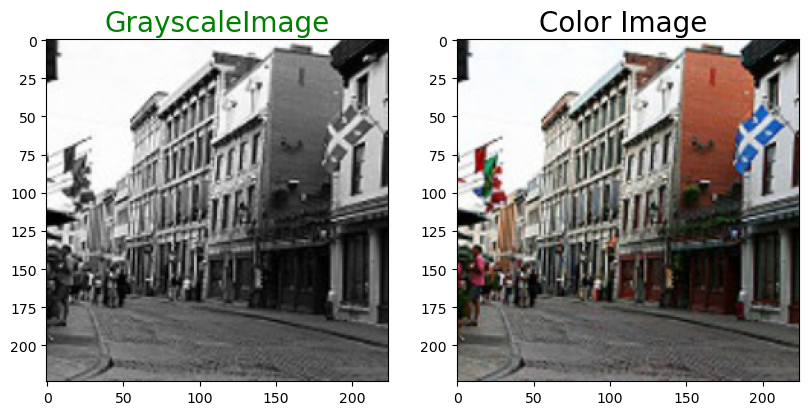

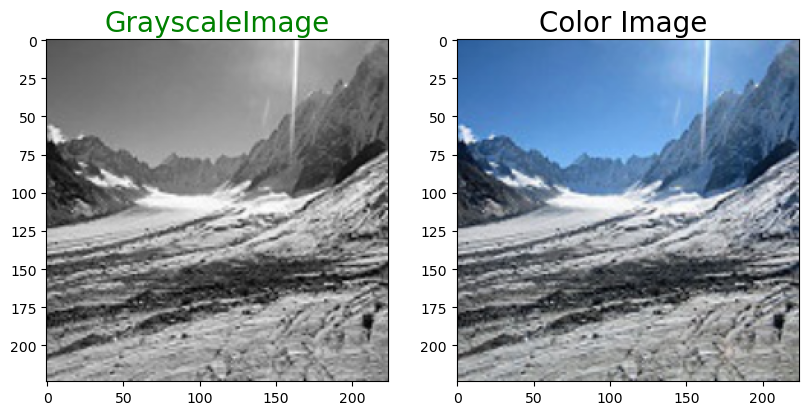

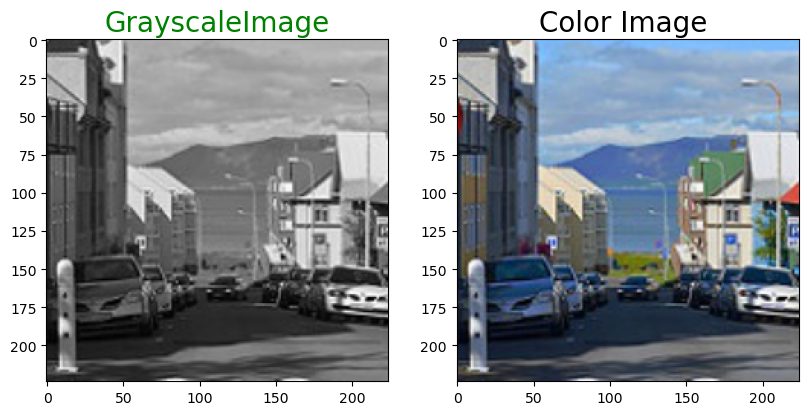

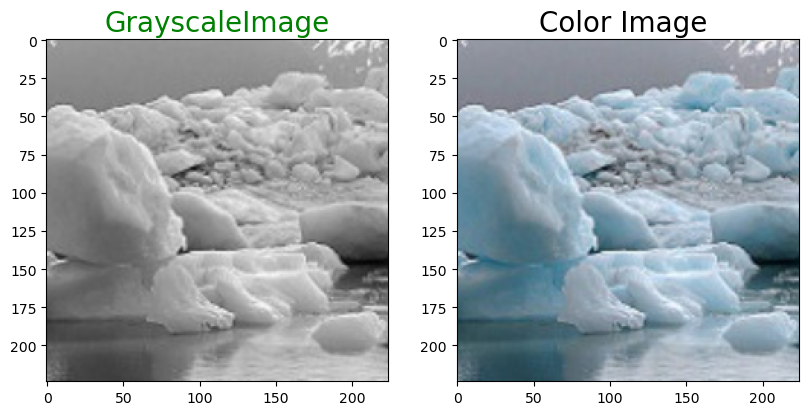

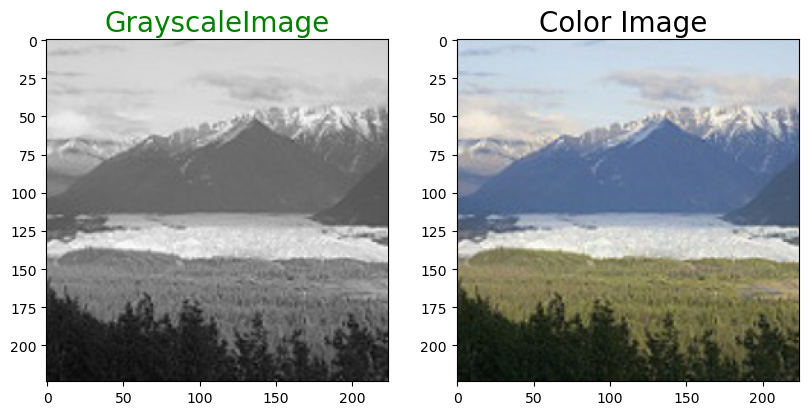

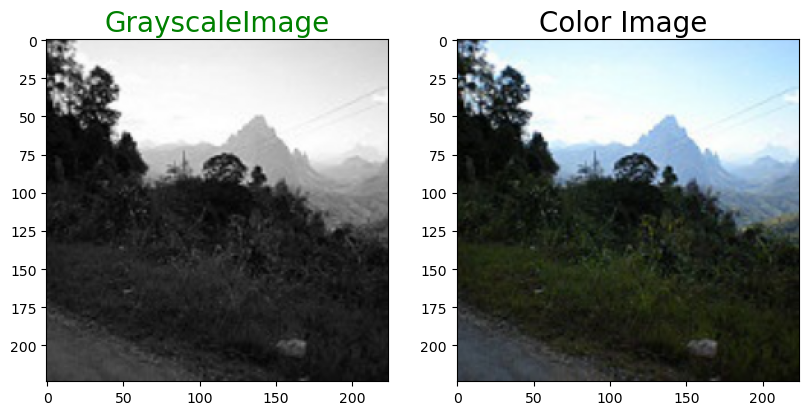

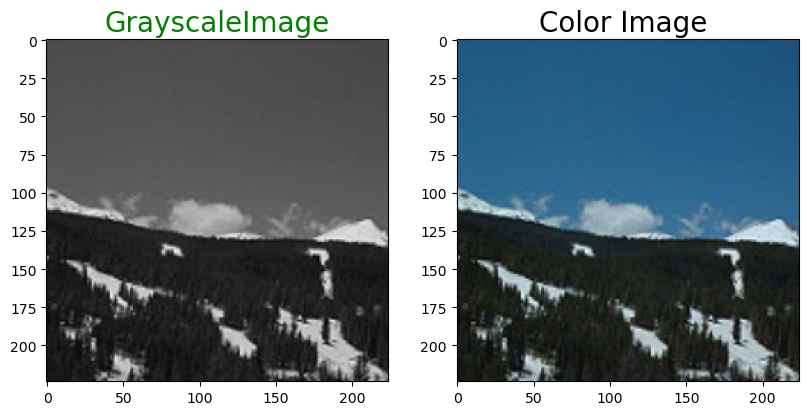

In [13]:
for i in range(3,10):
     plot_images(gray_img_train[i],color_img_train[i])

### CONVERTING RBG IMAGES TO LAB FORMAT , STORING THEM AS L CHANNELS AND AB CHANNELS

In [14]:
def convert_to_lab(color_images):
    
    gray_channels = []
    ab_channels = []
    
    for img in color_images:
        # Convert color image to LAB format
        try:
            
            lab_img = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
            lab_img = lab_img.astype('float32')

            gray_channels.append(lab_img[:,:,0] / 100.0)
            ab_channels.append(lab_img[:,:,1:] / 128.0)

        except:
            print('error')

    gray_channels = np.array(gray_channels)
    ab_channels = np.array(ab_channels)
    
    gray_channels = gray_channels.reshape(gray_channels.shape+(1,)) #dimensions to be the same for X and Y
    
    return gray_channels, ab_channels

### CONVERT TRAIN IMAGES TO LAB FORMAT

In [15]:
lab_gray_train_images, lab_ab_train_images = convert_to_lab(color_img_train)

In [16]:
print(lab_gray_train_images.shape)
print(lab_ab_train_images.shape)

(4000, 224, 224, 1)
(4000, 224, 224, 2)


### CONVERT TEST IMAGES TO LAB FORMAT

In [17]:
lab_gray_test_images, lab_ab_test_images = convert_to_lab(color_img_test)

In [18]:
print(lab_gray_test_images.shape)
print(lab_ab_test_images.shape)

(1000, 224, 224, 1)
(1000, 224, 224, 2)


### BUILDING THE AUTOENCODER MODEL

In [19]:
def autoencoder():

    #ENCODER
    model = Sequential()
    model.add(Conv2D(64, (3,3), activation='relu', padding='same', strides=2, input_shape=(224, 224, 1)))

    model.add(Conv2D(128, (3,3), activation='relu', padding='same'))
    model.add(Conv2D(128, (3,3), activation='relu', padding='same', strides=2))

    model.add(Conv2D(256, (3,3), activation='relu', padding='same'))
    model.add(Conv2D(256, (3,3), activation='relu', padding='same', strides=2))

    model.add(Conv2D(512, (3,3), activation='relu', padding='same'))
    model.add(Conv2D(512, (3,3), activation='relu', padding='same'))
    

    #DECODER

    model.add(Conv2D(256, (3,3), activation='relu', padding='same'))
    model.add(Conv2D(128, (3,3), activation='relu', padding='same'))
    model.add(UpSampling2D((2, 2)))

    model.add(Conv2D(64, (3,3), activation='relu', padding='same'))
    model.add(UpSampling2D((2, 2)))
    
    model.add(Conv2D(32, (3,3), activation='relu', padding='same'))
    model.add(Conv2D(16, (3,3), activation='relu', padding='same'))
    model.add(Conv2D(2, (3, 3), activation='tanh', padding='same'))
    model.add(UpSampling2D((2, 2)))
    

    return model

In [20]:
acnn = autoencoder()
acnn.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 112, 112, 64)      640       
                                                                 
 conv2d_1 (Conv2D)           (None, 112, 112, 128)     73856     
                                                                 
 conv2d_2 (Conv2D)           (None, 56, 56, 128)       147584    
                                                                 
 conv2d_3 (Conv2D)           (None, 56, 56, 256)       295168    
                                                                 
 conv2d_4 (Conv2D)           (None, 28, 28, 256)       590080    
                                                                 
 conv2d_5 (Conv2D)           (None, 28, 28, 512)       1180160   
                                                                 
 conv2d_6 (Conv2D)           (None, 28, 28, 512)       2

### COMPILING THE MODEL WITH OPTIMIZER, LOSS FUNCTION AND METRICS

In [21]:
acnn.compile(optimizer='adam', loss='mse', metrics=['accuracy'])

### LEARNING RATE REDUCTION, EARLY STOPPING CALLBACK

In [22]:
from keras.callbacks import ModelCheckpoint

learning_rate_reduction = ReduceLROnPlateau(monitor='val_loss', 
                                            patience=5, 
                                            verbose=1, 
                                            factor=0.5,
                                            min_lr=0.00001)

model_checkpoint = ModelCheckpoint(monitor='val_loss',
                                   mode = 'min',
                                   save_best_only=True,
                                   save_weights_only=True,
                                   verbose=1,
                                   filepath='AutoEncoder.h5')

### FIT THE MODEL: 
##### INPUT: GRAYSCALE IMAGE
##### OUTPUT: COLORED IMAGE

In [ ]:
acnn.fit(lab_gray_train_images, lab_ab_train_images,
         validation_split=0.2,
         epochs=20, 
         batch_size=50,shuffle=True,
         callbacks=[learning_rate_reduction,model_checkpoint])

Epoch 1/20
64/64 [==============================] - ETA: 0s - loss: 0.0128 - accuracy: 0.4957
Epoch 1: val_loss improved from inf to 0.01322, saving model to AutoEncoder.h5
64/64 [==============================] - 618s 10s/step - loss: 0.0128 - accuracy: 0.4957 - val_loss: 0.0132 - val_accuracy: 0.5638 - lr: 0.0010
Epoch 2/20
64/64 [==============================] - ETA: 0s - loss: 0.0122 - accuracy: 0.5215
Epoch 2: val_loss improved from 0.01322 to 0.01298, saving model to AutoEncoder.h5
64/64 [==============================] - 588s 9s/step - loss: 0.0122 - accuracy: 0.5215 - val_loss: 0.0130 - val_accuracy: 0.5556 - lr: 0.0010
Epoch 3/20
64/64 [==============================] - ETA: 0s - loss: 0.0121 - accuracy: 0.5385
Epoch 3: val_loss improved from 0.01298 to 0.01286, saving model to AutoEncoder.h5
64/64 [==============================] - 606s 9s/step - loss: 0.0121 - accuracy: 0.5385 - val_loss: 0.0129 - val_accuracy: 0.5587 - lr: 0.0010
Epoch 4/20
64/64 [=========================

### SAVE THE MODEL AND WEIGHTS

In [ ]:
acnn.save("autoencoder_backup.h5")

### LOAD THE MODEL

In [23]:
acnn = load_model("C:\\Users\\rkven\\Downloads\\Landscapes_DLCASESTUDY\\LandScape_Images\\AutoEncoder_Model.h5")

### EVALUATE AUTOENCODER MODEL ON TESTING SET: 1000 IMAGES BATCH SIZE: 50

In [24]:
acnn.evaluate(lab_gray_test_images, lab_ab_test_images, batch_size=50)

20/20 [==============================] - 39s 2s/step - loss: 0.0090 - accuracy: 0.6798


[0.00898004975169897, 0.6797855496406555]

### SHOW THE PREDICTIONS FOR 10 TEST IMAGES

1/1 [==============================] - 0s 233ms/step


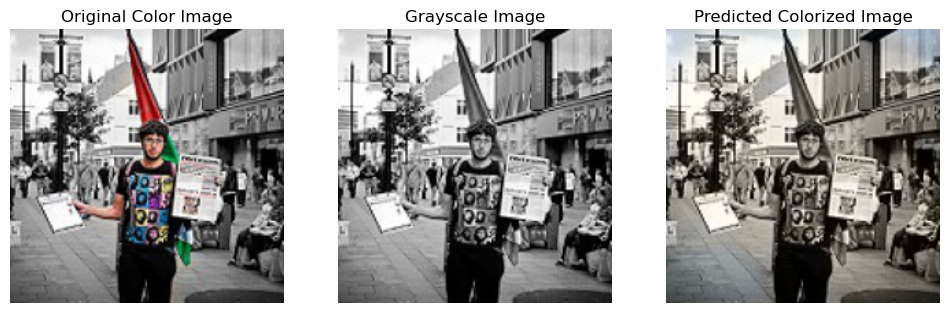

1/1 [==============================] - 0s 82ms/step


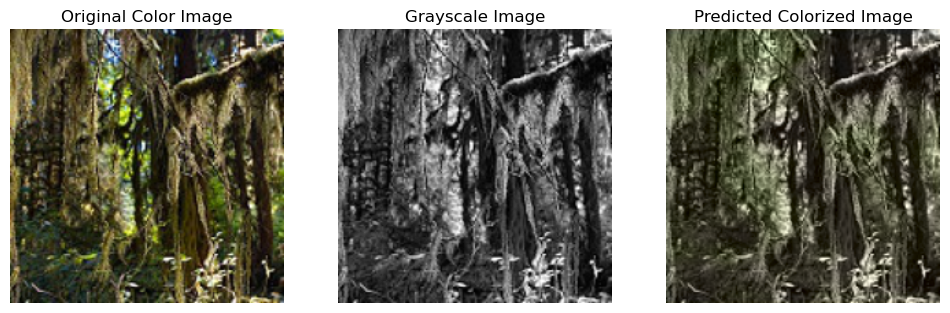

1/1 [==============================] - 0s 62ms/step


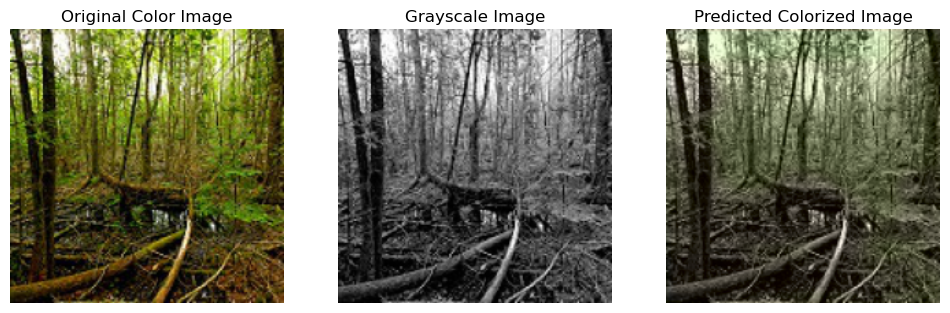

1/1 [==============================] - 0s 61ms/step


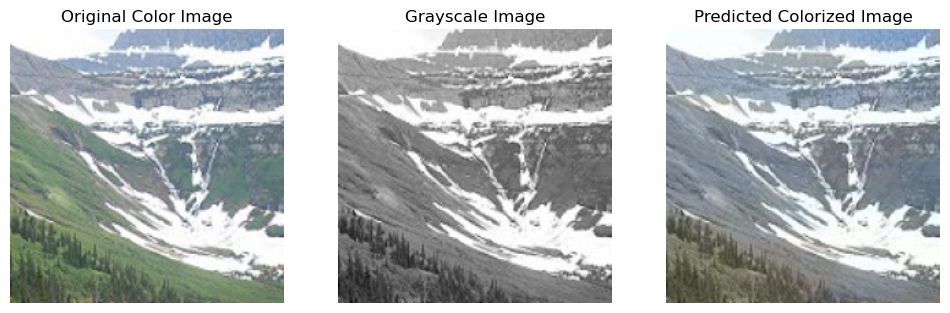

1/1 [==============================] - 0s 57ms/step


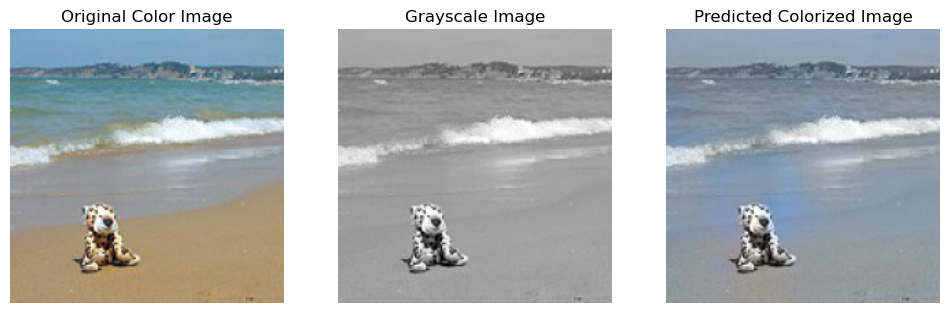

1/1 [==============================] - 0s 50ms/step


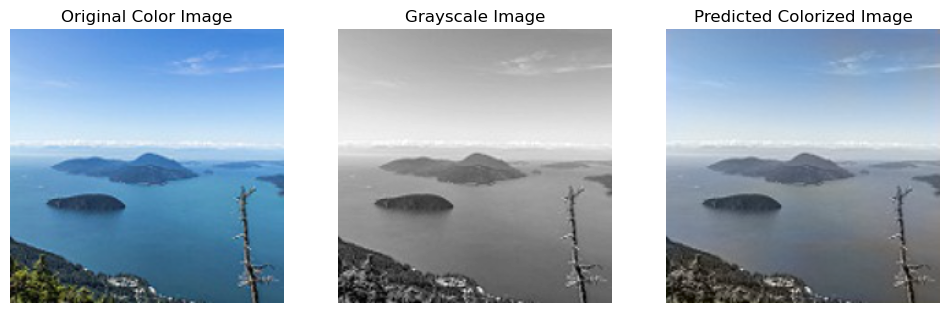

1/1 [==============================] - 0s 54ms/step


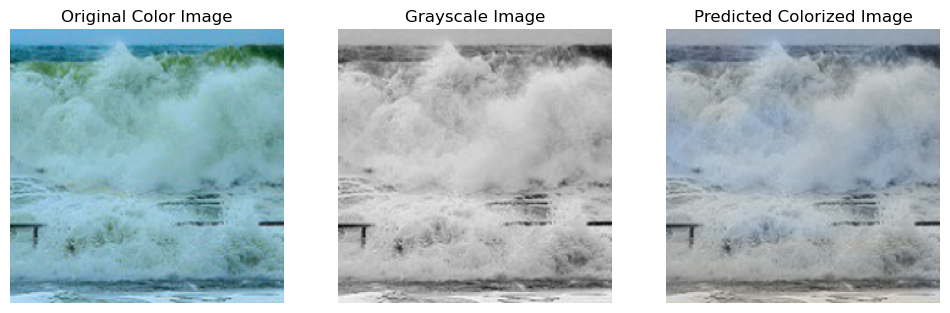

1/1 [==============================] - 0s 66ms/step


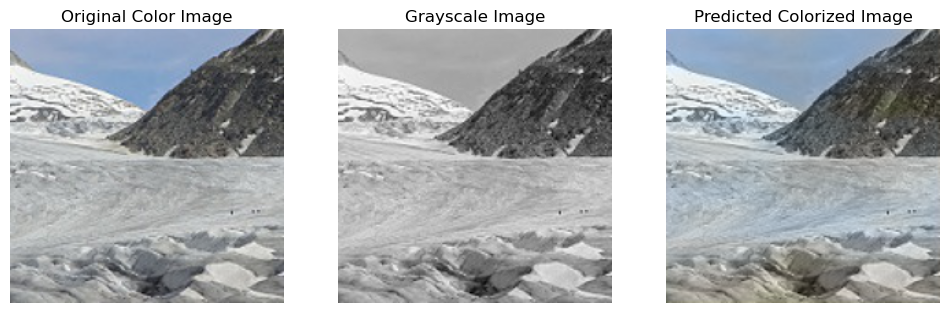

1/1 [==============================] - 0s 91ms/step


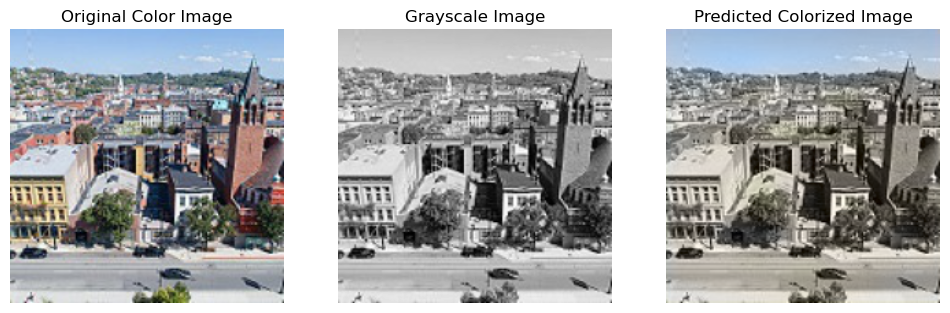

1/1 [==============================] - 0s 66ms/step


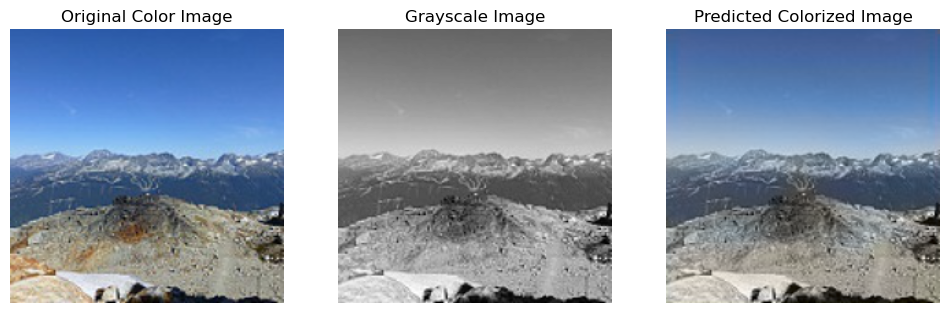

In [25]:
num_images = 10

for i in range(num_images):

    # Original color image
    orig_img = color_img_test[i]

    # Corresponding grayscale image and rescaling
    gray_sample = lab_gray_test_images[i]
    gray_sample = gray_sample.reshape(1, 224, 224, 1)
    

    # Predict the colorized image -> AB CHANNEL IMAGE
    predicted_image = acnn.predict(gray_sample)


    # Rescale the colorized image to original dimensions
    predicted_image = predicted_image * 128.0
    predicted_image = predicted_image.reshape(224, 224, 2)

    # Rescale grayscale input to original dimensions
    gray_sample = gray_sample * 100.0
    gray_sample = gray_sample.reshape(224, 224, 1)

    #L AND AB CHANNELS FUSED TO FORM IMAGE AND CONVERT IT TO RGB
    lab_img = np.concatenate((gray_sample, predicted_image), axis=2)
    rgb_img = cv2.cvtColor(lab_img, cv2.COLOR_LAB2RGB)


    # Plot the original, grayscale, and colorized images
    fig, axs = plt.subplots(1, 3, figsize=(12, 4))
    axs[0].imshow(orig_img)
    axs[0].set_title("Original Color Image")
    axs[0].axis('off')
    axs[1].imshow(gray_sample, cmap='gray')
    axs[1].set_title("Grayscale Image")
    axs[1].axis('off')
    axs[2].imshow(rgb_img)
    axs[2].set_title("Predicted Colorized Image")
    axs[2].axis('off')

    plt.show()

# AUTOENCODER + CNN HYBRID ARCHITECTURE

### CNN USED FOR ARCHITECTURE: INCEPTION_RESNET_V2

In [26]:
inception = InceptionResNetV2(weights=None, include_top=True)
inception.load_weights('inception_resnet_v2_weights.h5')

### CREATE INCEPTION EMBEDDING FOR TRAINING AND TESTING GRAY SCALE IMAGES

In [27]:
def create_inception_embedding(gray_imgs):
    #list for storing all embeddings
    
    def resize_gray(x):
        return resize(x, (299, 299, 3), mode='constant')
    
    image_resized = np.array([resize_gray(x) for x in gray_imgs])
    image_preprocessed = preprocess_input(image_resized)
    embed = inception.predict(image_preprocessed)

    return embed

In [28]:
inception_embedding = create_inception_embedding(gray_img_train)

125/125 [==============================] - 420s 3s/step


In [29]:
inception_embedding_test = create_inception_embedding(gray_img_test)

32/32 [==============================] - 97s 3s/step


In [30]:
inception_embedding.shape

(4000, 1000)

In [39]:
inception_embedding_test.shape

(1000, 1000)

### BUILDING THE HYBRID MODEL

In [40]:
def hybridautocnn():

    embed_input = Input(shape=(1000,))
    image_input = Input(shape=(224, 224, 1,))

    # Encoder
    encoder = Conv2D(64, (3, 3), activation='relu', padding='same', strides=2)(image_input)
    encoder = Conv2D(128, (3, 3), activation='relu', padding='same')(encoder)
    encoder = Conv2D(128, (3, 3), activation='relu', padding='same', strides=2)(encoder)
    encoder = Conv2D(256, (3, 3), activation='relu', padding='same')(encoder)
    encoder = Conv2D(256, (3, 3), activation='relu', padding='same', strides=2)(encoder)
    encoder = Conv2D(512, (3, 3), activation='relu', padding='same')(encoder)
    encoder = Conv2D(512, (3, 3), activation='relu', padding='same')(encoder)
    encoder = Conv2D(256, (3, 3), activation='relu', padding='same')(encoder)

    # Fusion
    fusion_output = RepeatVector(28 * 28)(embed_input) 
    fusion_output = Reshape(([28, 28, 1000]))(fusion_output)
    fusion_output = concatenate([encoder, fusion_output], axis=3) 


    # Decoder
    decoder = Conv2D(128, (3, 3), activation='relu', padding='same')(fusion_output)
    decoder = UpSampling2D((2, 2))(decoder)

    decoder = Conv2D(64, (3, 3), activation='relu', padding='same')(decoder)
    decoder = UpSampling2D((2, 2))(decoder)

    decoder = Conv2D(32, (3, 3), activation='relu', padding='same')(decoder)
    decoder = Conv2D(16, (3, 3), activation='relu', padding='same')(decoder)
    
    decoder_output = Conv2D(2, (3, 3), activation='softmax', padding='same')(decoder)
    output = UpSampling2D((2, 2))(decoder_output)

    # Create the full model
    full_model = Model(inputs=[image_input, embed_input], outputs=output)

    return full_model

### SUMMARY OF THE MODEL

In [41]:
hcnn = hybridautocnn()
hcnn.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 224, 224, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_229 (Conv2D)            (None, 112, 112, 64  640         ['input_5[0][0]']                
                                )                                                                 
                                                                                                  
 conv2d_230 (Conv2D)            (None, 112, 112, 12  73856       ['conv2d_229[0][0]']             
                                8)                                                          

### COMPILING THE MODEL WITH OPTIMIZER, LOSS FUNCTION AND METRICS

In [42]:
hcnn.compile(optimizer='adam', loss='mse', metrics=['accuracy'])

### LEARNING RATE REDUCTION, EARLY STOPPING CALLBACK

In [43]:
from keras.callbacks import ModelCheckpoint

learning_rate_reduction_hybrid = ReduceLROnPlateau(monitor='val_loss', 
                                                   patience=5, 
                                                   verbose=1, 
                                                   factor=0.5,
                                                   min_lr=0.00001)


model_checkpoint_hybrid = ModelCheckpoint(monitor='val_loss',
                                          mode = 'min',
                                          save_best_only=True,
                                          save_weights_only=True,
                                          verbose=1,
                                          filepath='HybridAutoCNN.h5')

### FIT THE MODEL
##### INPUT: GRAYSCALE IMAGE
##### OUTPUT: COLOURED IMAGE

In [29]:
hcnn.fit([lab_gray_train_images, inception_embedding], 
         lab_ab_train_images,
         validation_split=0.2,
         epochs=20, 
         batch_size=50,shuffle=True,
         callbacks=[learning_rate_reduction_hybrid,model_checkpoint_hybrid])

Epoch 1/20
64/64 [==============================] - ETA: 0s - loss: 0.0124 - accuracy: 0.4848
Epoch 1: val_loss improved from inf to 0.01330, saving model to HybridAutoCNN.h5
64/64 [==============================] - 597s 9s/step - loss: 0.0124 - accuracy: 0.4848 - val_loss: 0.0133 - val_accuracy: 0.5183 - lr: 0.0010
Epoch 2/20
64/64 [==============================] - ETA: 0s - loss: 0.0123 - accuracy: 0.4958
Epoch 2: val_loss did not improve from 0.01330
64/64 [==============================] - 582s 9s/step - loss: 0.0123 - accuracy: 0.4958 - val_loss: 0.0137 - val_accuracy: 0.5011 - lr: 0.0010
Epoch 3/20
64/64 [==============================] - ETA: 0s - loss: 0.0123 - accuracy: 0.4931
Epoch 3: val_loss improved from 0.01330 to 0.01317, saving model to HybridAutoCNN.h5
64/64 [==============================] - 580s 9s/step - loss: 0.0123 - accuracy: 0.4931 - val_loss: 0.0132 - val_accuracy: 0.5327 - lr: 0.0010
Epoch 4/20
64/64 [==============================] - ETA: 0s - loss: 0.0122 -

### SAVE THE MODEL AND WEIGHTS

In [30]:
hcnn.save("Hybrid_Model.h5")

### LOAD THE MODEL

In [44]:
hcnn = load_model("C:\\Users\\rkven\\Downloads\\Landscapes_DLCASESTUDY\\LandScape_Images\\Hybrid_Model.h5")

### EVALUATE HYBRID MODEL ON TESTING SET: 1000 IMAGES BATCH SIZE: 50

In [38]:
hcnn.evaluate([lab_gray_test_images,inception_embedding_test], lab_ab_test_images, batch_size=50)

20/20 [==============================] - 39s 2s/step - loss: 0.0098 - accuracy: 0.6766


[0.009806279093027115, 0.6766254901885986]

### SHOW PREDICTIONS FOR 10 TEST IMAGES

1/1 [==============================] - 0s 262ms/step


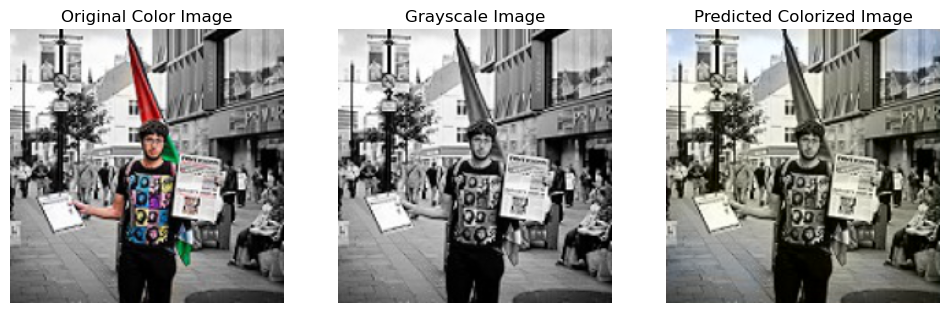

1/1 [==============================] - 0s 92ms/step


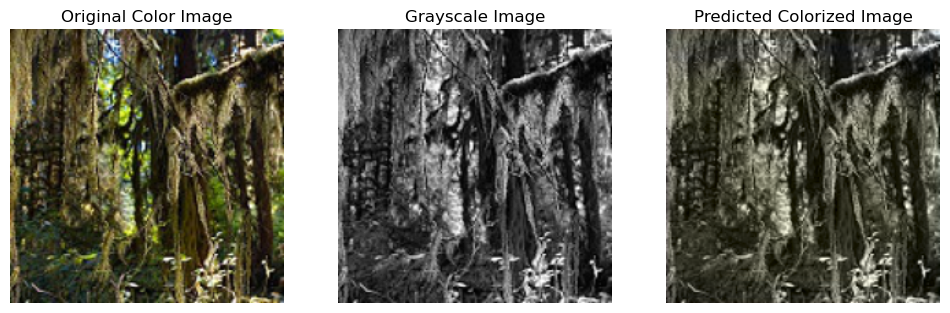

1/1 [==============================] - 0s 70ms/step


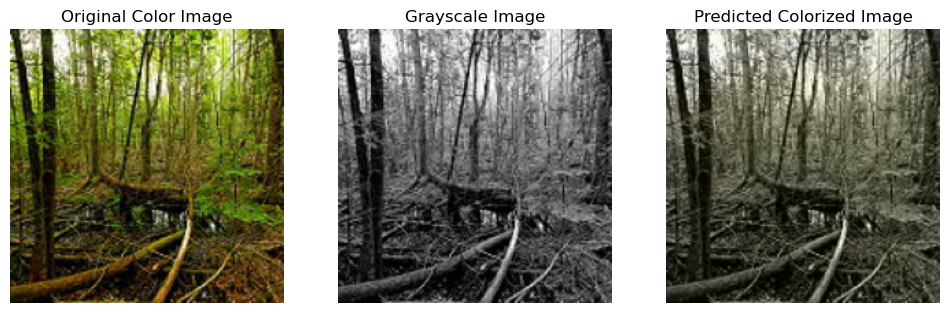

1/1 [==============================] - 0s 63ms/step


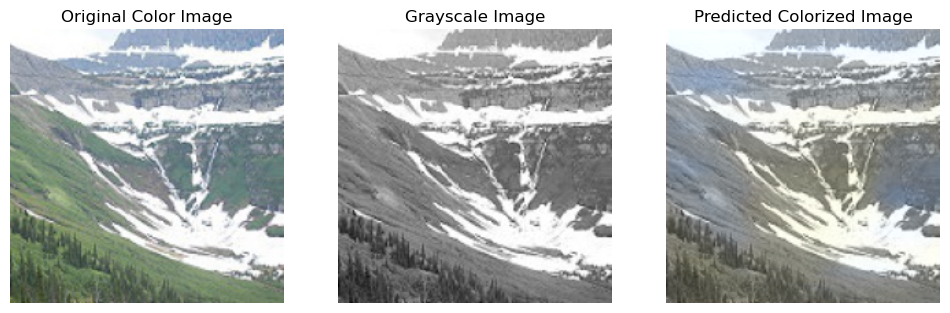

1/1 [==============================] - 0s 82ms/step


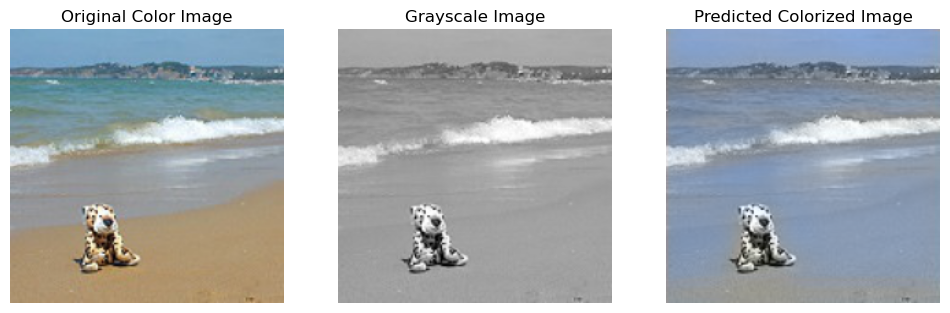

1/1 [==============================] - 0s 72ms/step


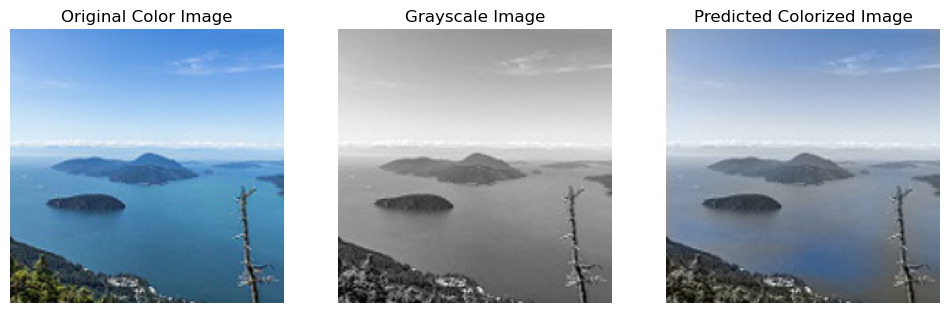

1/1 [==============================] - 0s 72ms/step


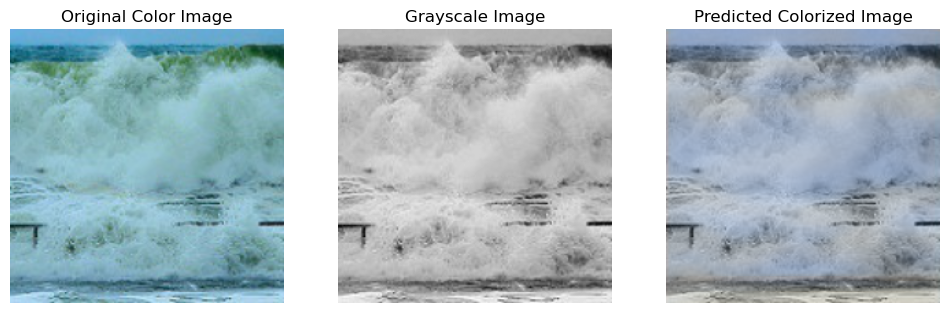

1/1 [==============================] - 0s 61ms/step


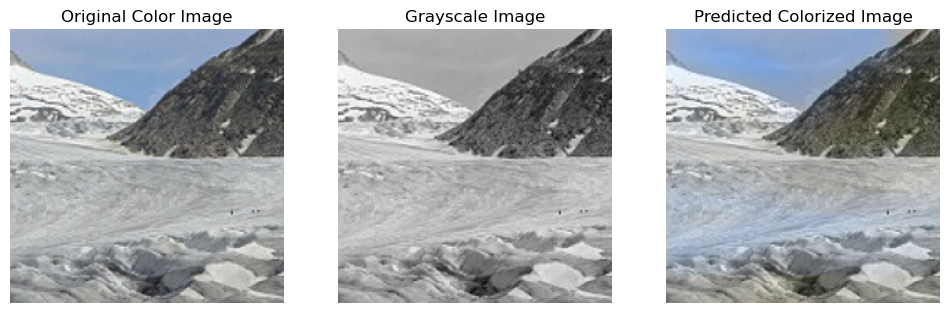

1/1 [==============================] - 0s 92ms/step


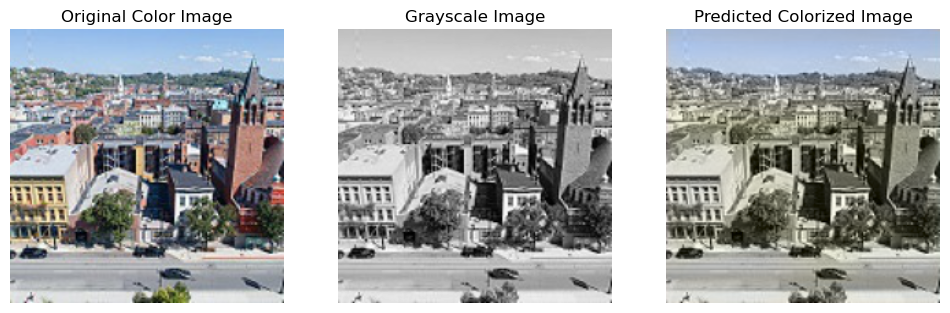

1/1 [==============================] - 0s 72ms/step


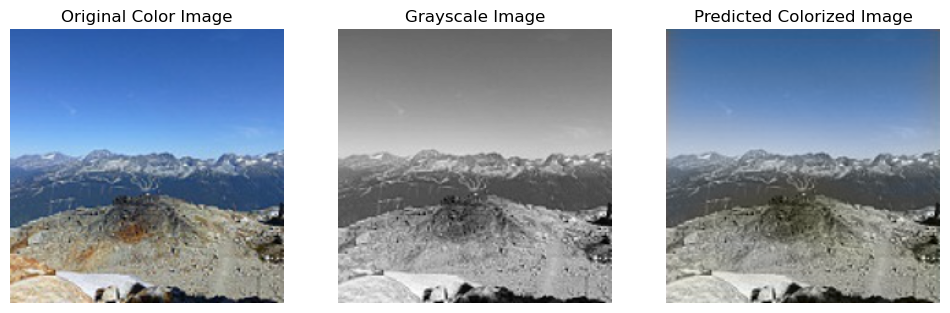

In [47]:
num_images=10


for i in range(num_images):

    #TAKE ORIGINAL COLORED IMAGE
    orig_img = color_img_test[i]

    #TAKE TEST GRAYSCALE IMAGE
    gray_sample = lab_gray_test_images[i]
    gray_sample = gray_sample.reshape(1, 224, 224, 1)
    
    #TAKE INCEPTION EMBEDDING OF TEST GRAYSCALE IMAGE
    embed_t = inception_embedding_test[i]
    embed_t = embed_t.reshape(1, 1000)


    # Predict the colorized image
    pred_img = hcnn.predict([gray_sample, embed_t])


    # Rescale the colorized image to original dimensions
    pred_img = pred_img * 128.0
    pred_img = pred_img.reshape(224, 224, 2)

    # Rescale grayscale input to original dimensions
    gray_sample = gray_sample * 100.0
    gray_sample = gray_sample.reshape(224, 224, 1)

    #L AND AB CHANNELS FUSED TO FORM IMAGE AND CONVERT IT TO RGB
    lab_img = np.concatenate((gray_sample, pred_img), axis=2)
    rgb_img = cv2.cvtColor(lab_img, cv2.COLOR_LAB2RGB)


    # Plot the original, grayscale, and colorized images
    fig, axs = plt.subplots(1, 3, figsize=(12, 4))
    axs[0].imshow(orig_img)
    axs[0].set_title("Original Color Image")
    axs[0].axis('off')
    axs[1].imshow(gray_sample.squeeze(), cmap='gray')
    axs[1].set_title("Grayscale Image")
    axs[1].axis('off')
    axs[2].imshow(rgb_img)
    axs[2].set_title("Predicted Colorized Image")
    axs[2].axis('off')

    plt.show()

### COMPARISON OF IMAGE COLORIZING BETWEEN VANILLA AUTOENCODERS AND HYBRID-AUTOENCODER-CNN MODEL

1/1 [==============================] - 0s 72ms/step


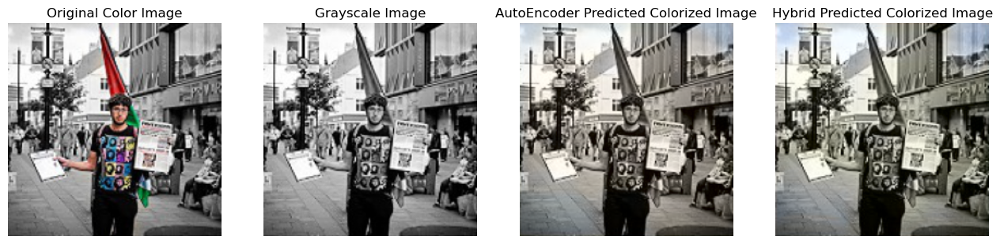

1/1 [==============================] - 0s 59ms/step


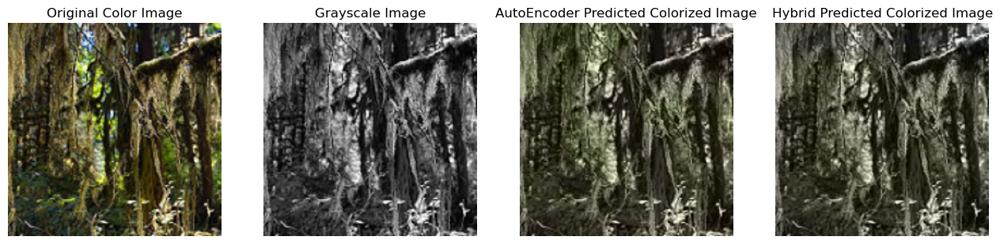

1/1 [==============================] - 0s 70ms/step


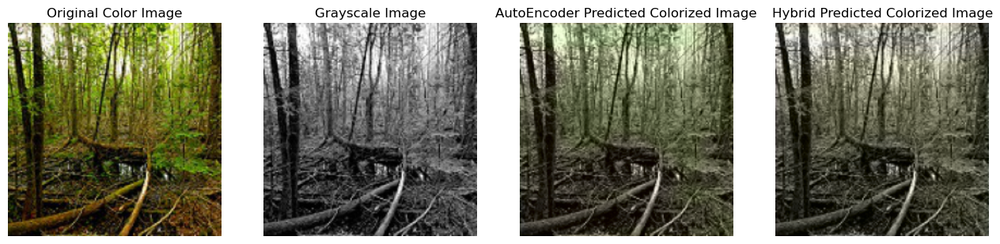

1/1 [==============================] - 0s 74ms/step


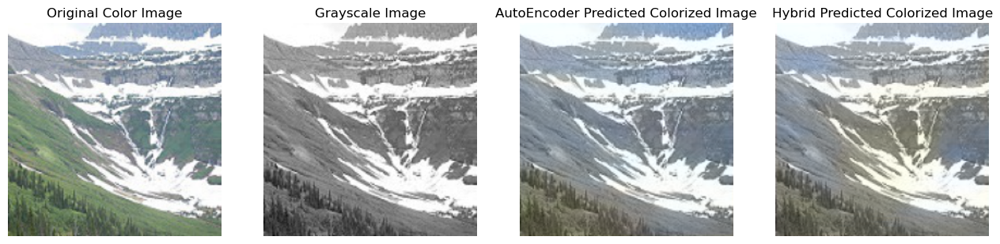

1/1 [==============================] - 0s 93ms/step


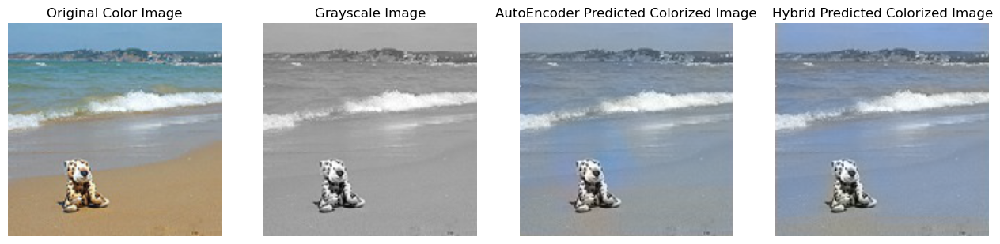

1/1 [==============================] - 0s 74ms/step


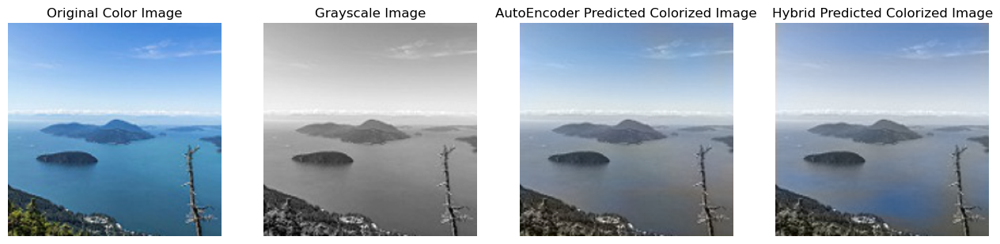

1/1 [==============================] - 0s 76ms/step


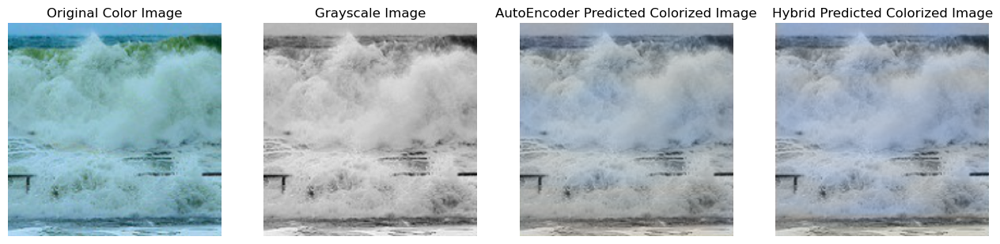

1/1 [==============================] - 0s 60ms/step


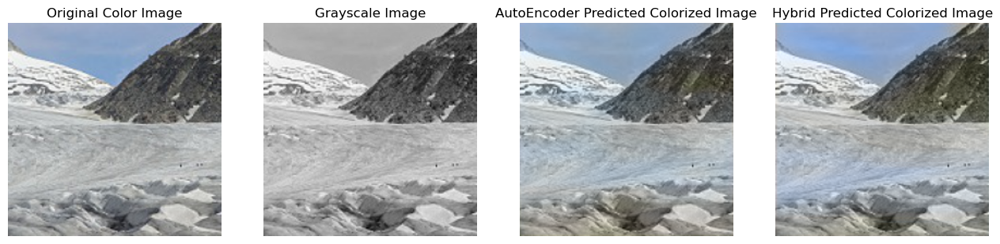

1/1 [==============================] - 0s 72ms/step


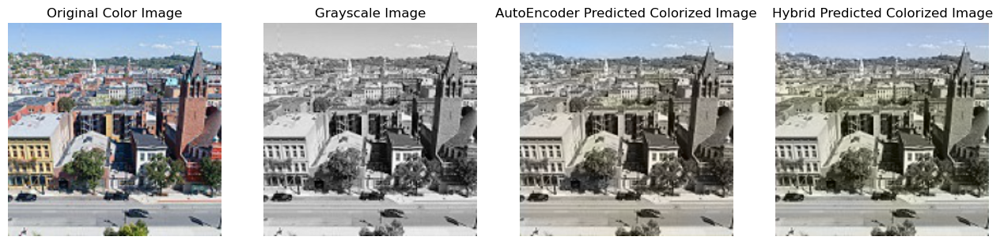

1/1 [==============================] - 0s 71ms/step


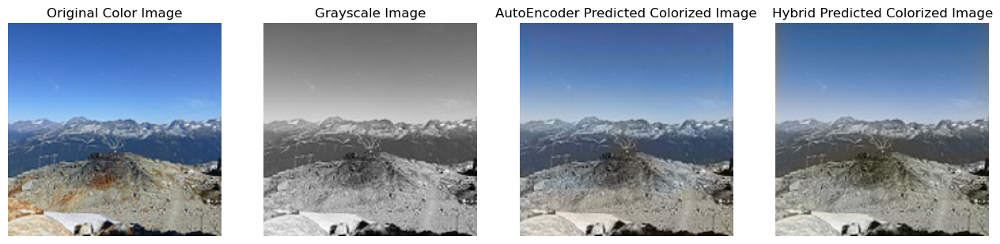

In [46]:
num_images=10

for i in range(num_images):

    #TAKE ORIGINAL COLORED IMAGE
    orig_img = color_img_test[i]

    #TAKE TEST GRAYSCALE IMAGE
    grayscale_t = lab_gray_test_images[i]
    grayscale_t = grayscale_t.reshape(1, 224, 224, 1)
    
    #TAKE INCEPTION EMBEDDING OF TEST GRAYSCALE IMAGE
    embed_t = inception_embedding_test[i]
    embed_t = embed_t.reshape(1, 1000)


    # Predict the colorized image
    predicted_image_vanilla = acnn.predict(grayscale_t)
    predicted_image_hybrid = hcnn.predict([grayscale_t,embed_t])


    # Rescale the colorized image to original dimensions
    predicted_image_vanilla = predicted_image_vanilla * 128.0
    predicted_image_vanilla = predicted_image_vanilla.reshape(224, 224, 2)

    predicted_image_hybrid = predicted_image_hybrid * 128.0
    predicted_image_hybrid = predicted_image_hybrid.reshape(224, 224, 2)

    # Rescale grayscale input to original dimensions
    grayscale_t = grayscale_t * 100.0
    grayscale_t = grayscale_t.reshape(224, 224, 1)

    #L AND AB CHANNELS FUSED TO FORM IMAGE AND CONVERT IT TO RGB
    lab_image_vanilla = np.concatenate((grayscale_t, predicted_image_vanilla), axis=2)
    rgb_image_vanilla = cv2.cvtColor(lab_image_vanilla, cv2.COLOR_LAB2RGB)

    lab_image_hybrid = np.concatenate((grayscale_t, predicted_image_hybrid), axis=2)
    rgb_image_hybrid = cv2.cvtColor(lab_image_hybrid, cv2.COLOR_LAB2RGB)


    # Plot the original, grayscale, and colorized images
    fig, axs = plt.subplots(1, 4, figsize=(16, 4))
    axs[0].imshow(orig_img)
    axs[0].set_title("Original Color Image")
    axs[0].axis('off')
    axs[1].imshow(grayscale_t.squeeze(), cmap='gray')
    axs[1].set_title("Grayscale Image")
    axs[1].axis('off')
    axs[2].imshow(rgb_image_vanilla)
    axs[2].set_title("AutoEncoder Predicted Colorized Image")
    axs[2].axis('off')
    axs[3].imshow(rgb_image_hybrid)
    axs[3].set_title("Hybrid Predicted Colorized Image")
    axs[3].axis('off')

    plt.show()